# Working with Imported Data: Cleaning and Analyzing

## Working with Data

For this section of notes, I will be using the 2020 Index of Economic Freedom. In order to import this data, I have moved the Excel spreadsheet into my "Class Notes" folder, so pandas can access it. As said, pandas library will be used, and we can actually print the dataset like we do a dictionary but it will show up as a spreadsheet in the output. Now, let's import our data:

In [1]:
import pandas as pd

data = pd.read_excel("index2020_data.xls", index_col = [1])

data.shape

(186, 33)

The last line of code shows us the shape of our data (rows and columns). The spreadsheet is now loaded, but in order to properly analyze it we might need to make some changes in the sheet itself. This will be called "cleaning", or getting rid of data parameters that are not useful in our analysis. We can begin by determining what our datasets keys are:

In [2]:
data.keys()

Index(['CountryID', 'WEBNAME', 'Region', 'World Rank', 'Region Rank',
       '2020 Score', 'Property Rights', 'Judical Effectiveness',
       'Government Integrity', 'Tax Burden', 'Gov't Spending', 'Fiscal Health',
       'Business Freedom', 'Labor Freedom', 'Monetary Freedom',
       'Trade Freedom', 'Investment Freedom ', 'Financial Freedom',
       'Tariff Rate (%)', 'Income Tax Rate (%)', 'Corporate Tax Rate (%)',
       'Tax Burden % of GDP', 'Gov't Expenditure % of GDP ', 'Country',
       'Population (Millions)', 'GDP (Billions, PPP)', 'GDP Growth Rate (%)',
       '5 Year GDP Growth Rate (%)', 'GDP per Capita (PPP)',
       'Unemployment (%)', 'Inflation (%)', 'FDI Inflow (Millions)',
       'Public Debt (% of GDP)'],
      dtype='object')

Now we will drop the unnecessary cloumns from the dataset. These columns will be "CountryID", "Region", "WEBNAME", and "Country".

In [3]:
skip_keys = ["CountryID", "Region", "WEBNAME", "Country"]
data_for_stats = data.drop(skip_keys, axis = 1)

data_for_stats = data_for_stats.dropna(thresh = len(data_for_stats.keys()))

Next, we will work on our regression statistics. We will make dictionaries that hold our statistics, one for covariance and one for correlation. 

In [4]:
import stats
stat = stats.stats()
stats_dict = {}
cov_dict = {}
corr_dict = {}

You created an instance of stats()


We have our instance of stats() now. Next, we can fill our dictionaries with the summary statistics. The easiest way to do this is with for loops. The stats_dict dictionary will be filled first, then the corr_dict and cov_dict next. These will be our dictionaries used to visualize our data.

In [5]:
for key1 in data_for_stats:
    vec1 = data_for_stats[key1]
    stats_dict[key1] = {}
    stats_dict[key1]["mean"] = stat.mean(vec1)
    stats_dict[key1]["median"] = stat.median(vec1)
    stats_dict[key1]["variance"] = stat.variance(vec1)
    stats_dict[key1]["standard deviation"] = stat.SD(vec1, sample = True)
    stats_dict[key1]["skewness"] = stat.skewness(vec1, sample = True)
    stats_dict[key1]["kurtosis"] = stat.kurtosis(vec1, sample = True)
    cov_dict[key1] = {}
    corr_dict[key1] = {}
    for key2 in data_for_stats:
        vec2 = data_for_stats[key2]
        cov_dict[key1][key2] =stat.covariance(vec1, vec2, sample = True)
        corr_dict[key1][key2] = stat.correlation(vec1, vec2)

Finally, we can show the tables in a more pleasing format. We will use pd.DataFrame() and dataframe.to_csv(path). 

In [6]:
stats_DF = pd.DataFrame(stats_dict)
cov_DF = pd.DataFrame(cov_dict).sort_index(axis = 1)
corr_DF = pd.DataFrame(corr_dict).sort_index(axis = 1)

stats_DF.to_csv("econFreedomStats.csv")
cov_DF.to_csv("econFreedomCovMatrix.csv")
corr_DF.to_csv("econFreedomCorrMatrix.csv")
data_for_stats.to_csv("cleanedEconFreedomData.csv")

# Visualizing the Data

The types of visualizations used will be scatterplots and correlation matrix heatmaps. We will use the cleaned data (in csv form) to make these plots. Let's start by loading the data:

In [7]:
import pandas as pd

data = pd.read_csv("cleanedEconFreedomData.csv", index_col = ["Country Name"])
scatter_cats = ["World Rank", "2020 Score", "Property Rights",
               "Judical Effectiveness", "5 Year GDP Growth Rate (%)",
               "GDP per Capita (PPP)"]
select_data = data[scatter_cats]

## Scatter Plots

This scatter plot will be very similar to the other functions we have created in class. Like before, we will have color, which adds a third dimension for us visually. After, the plots will be saved into a PDF for easier access.

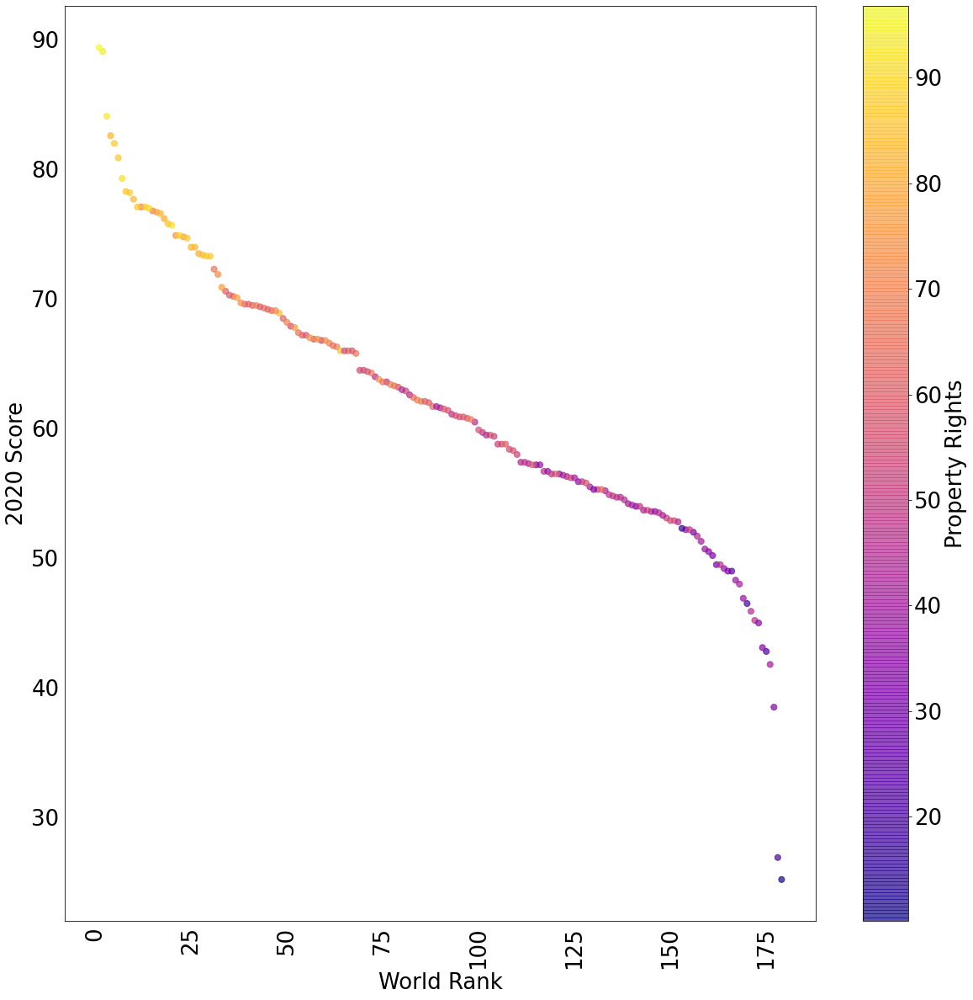

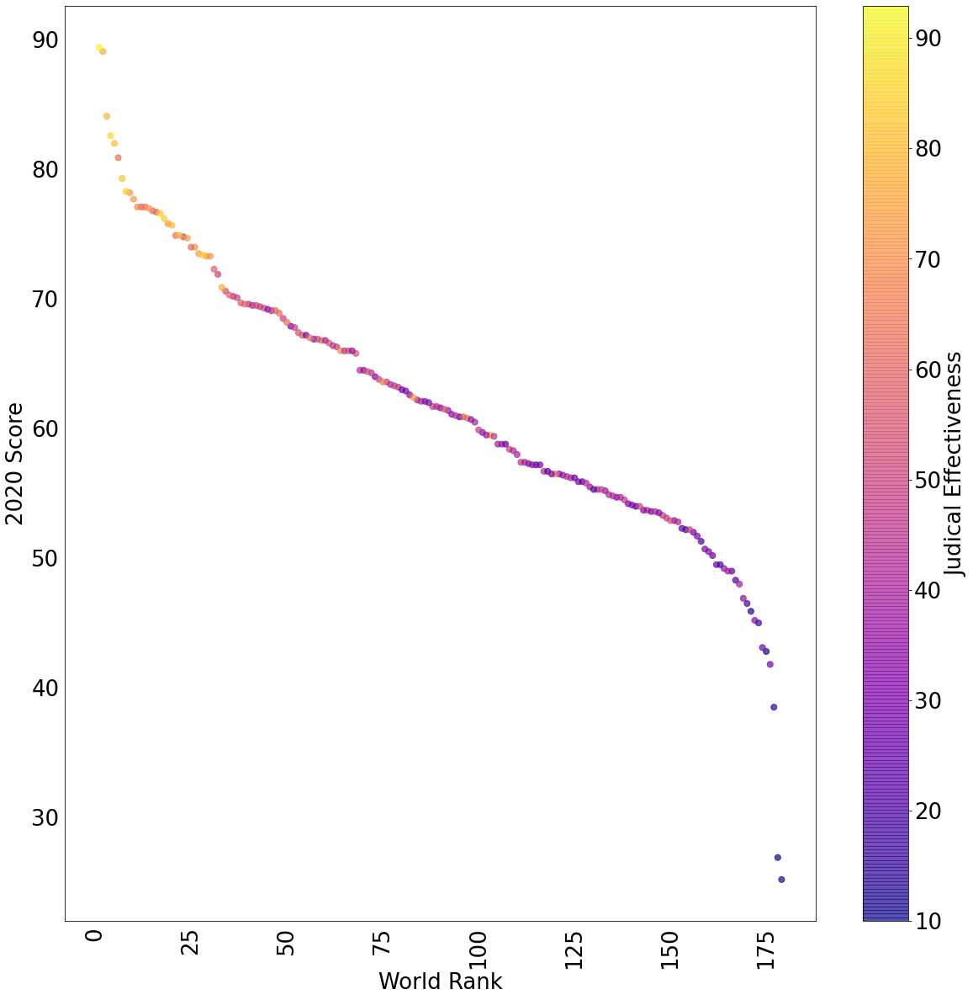

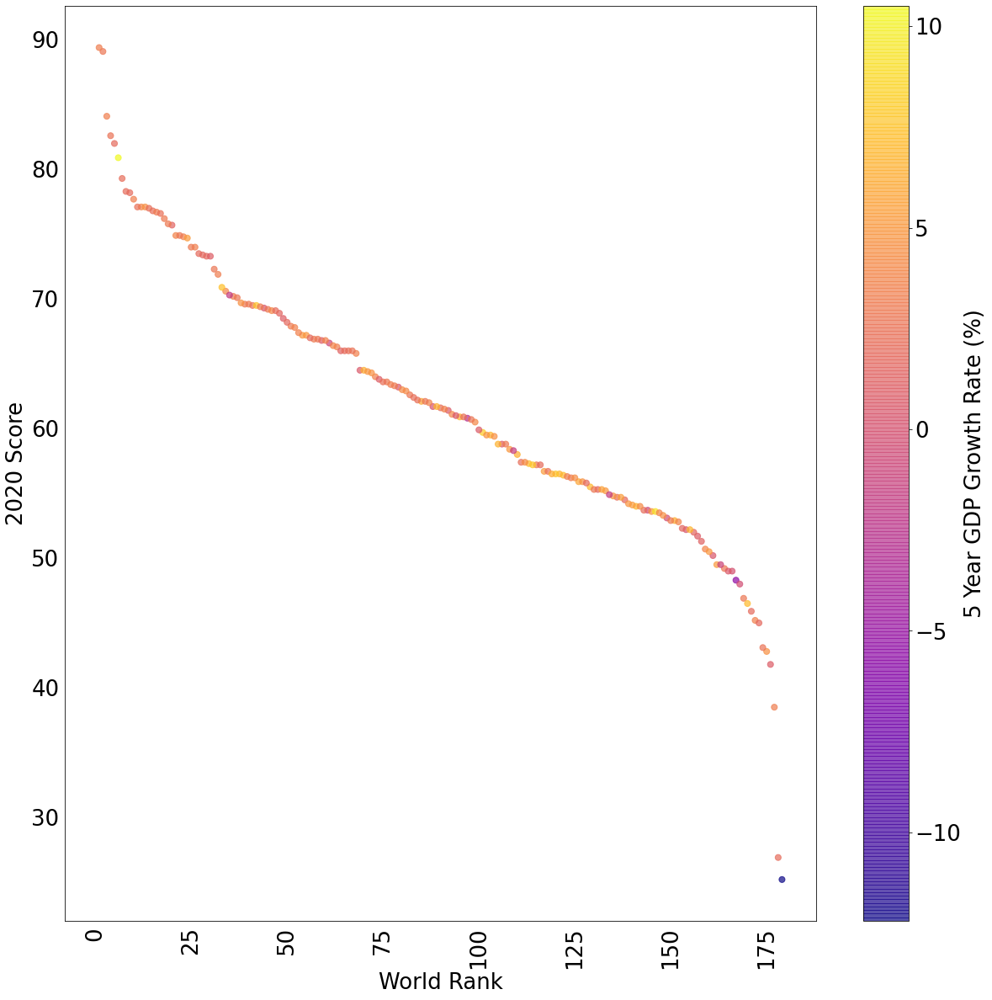

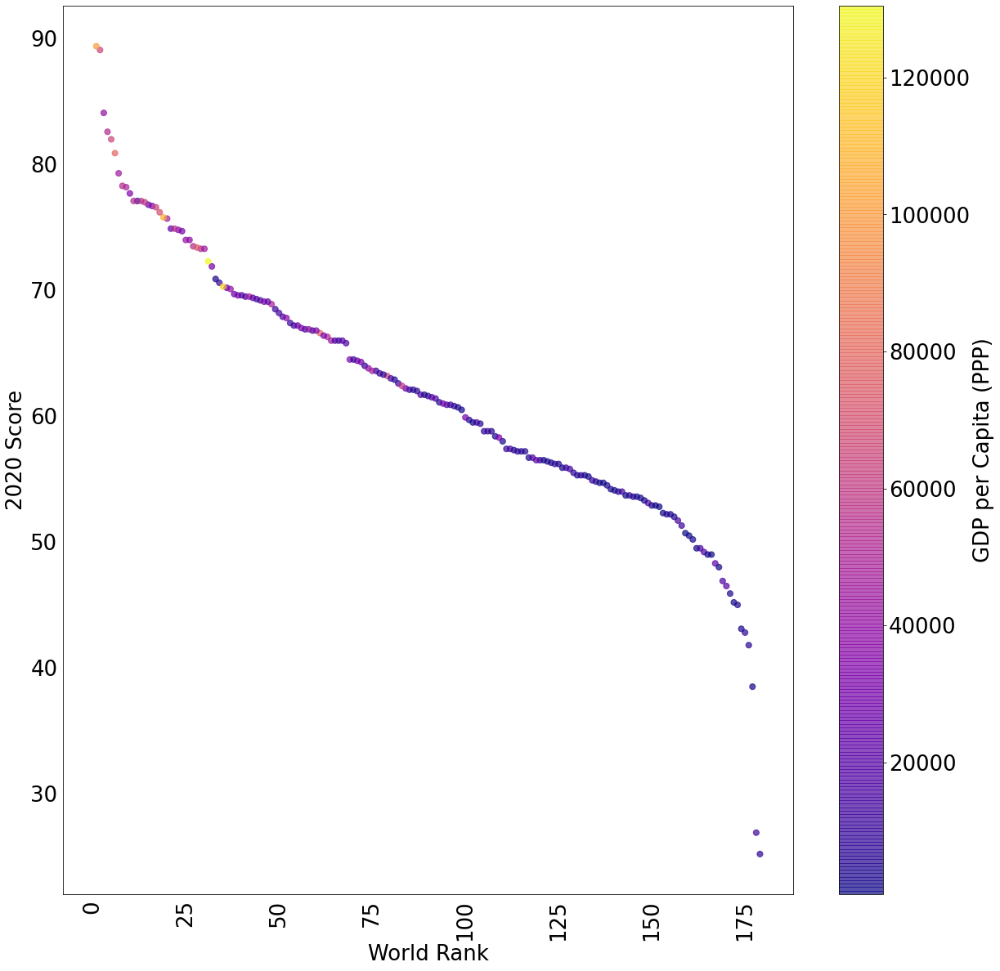

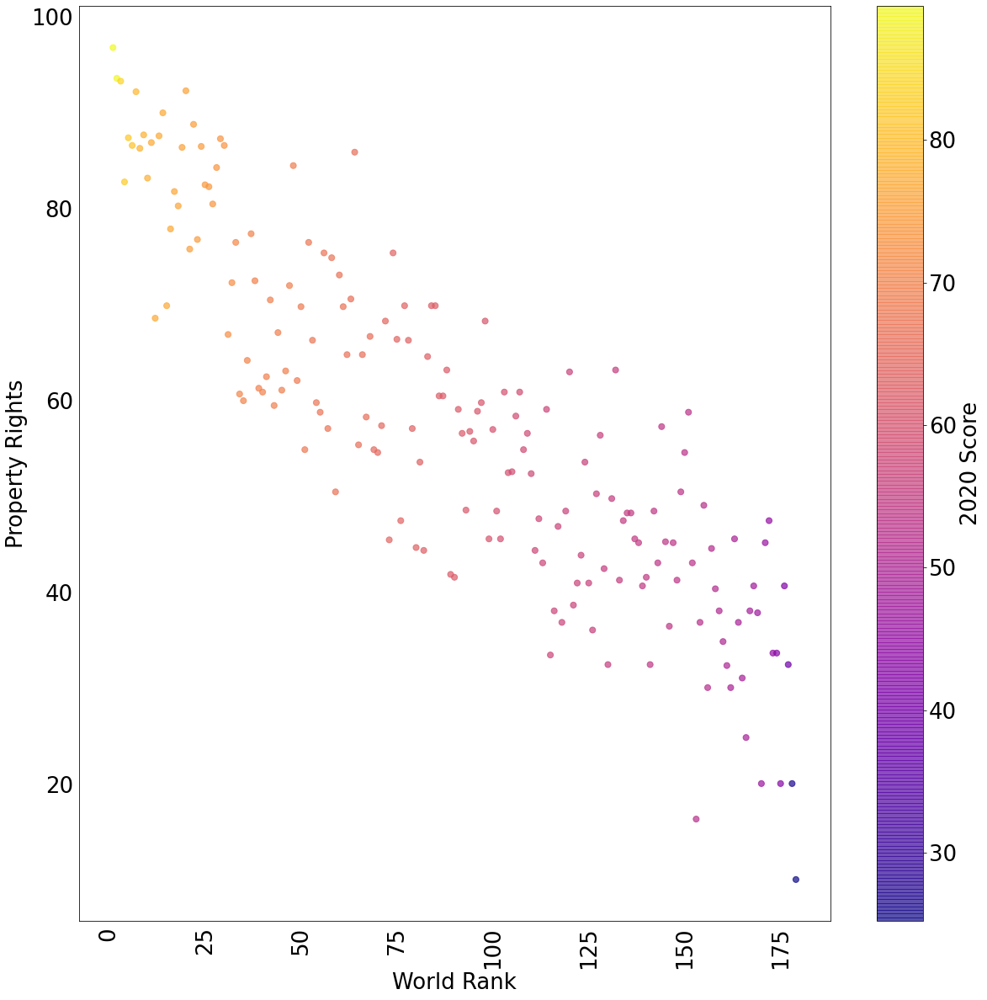

...

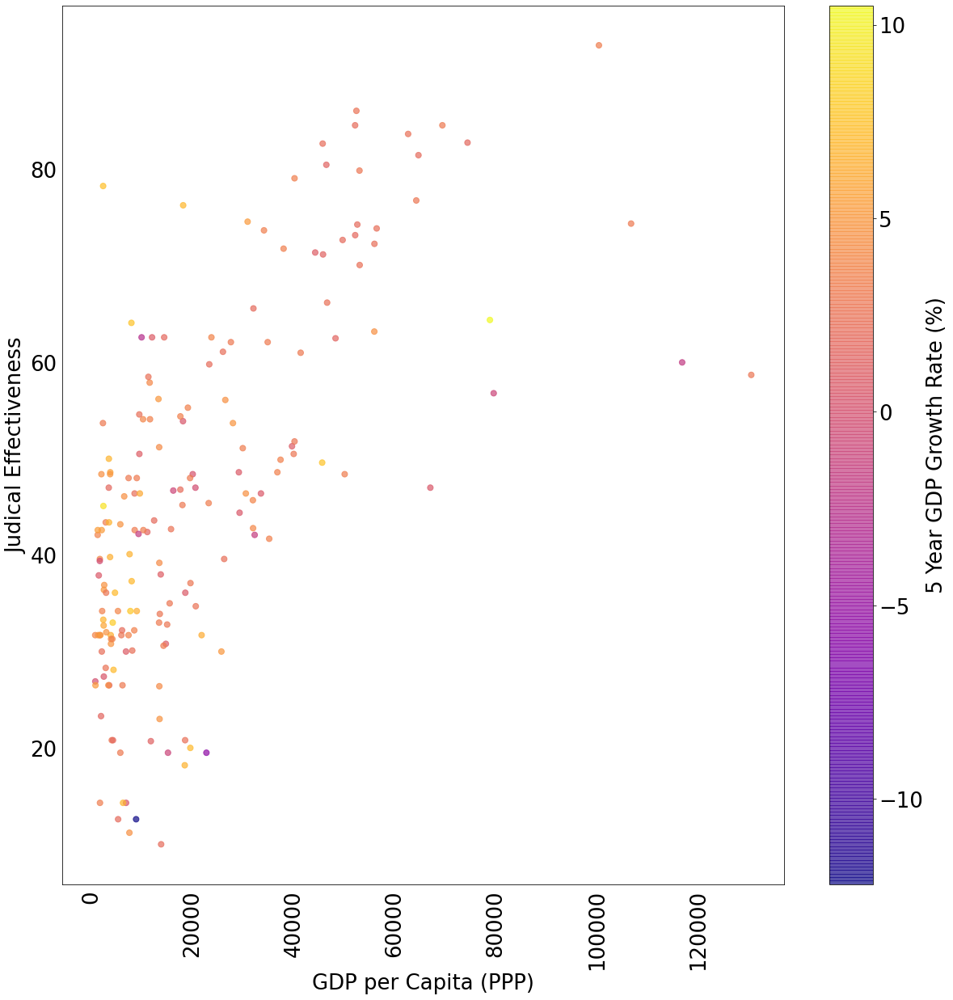

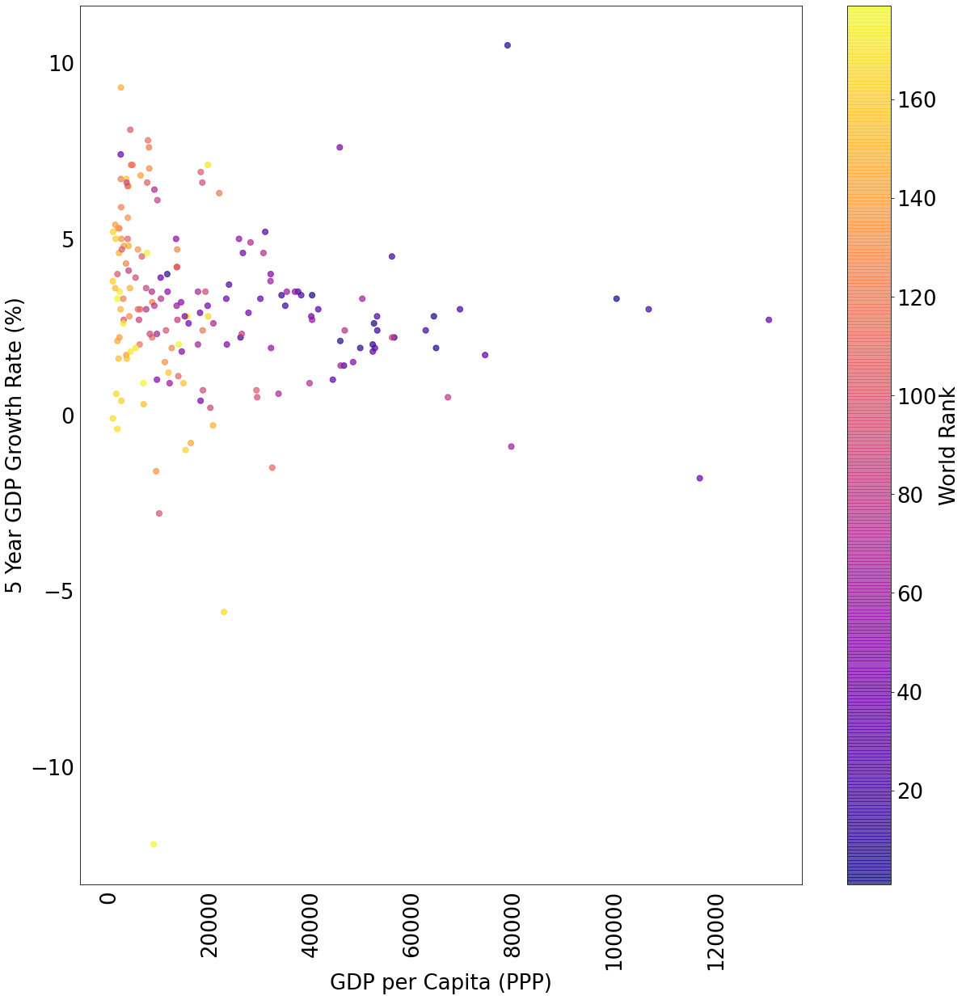

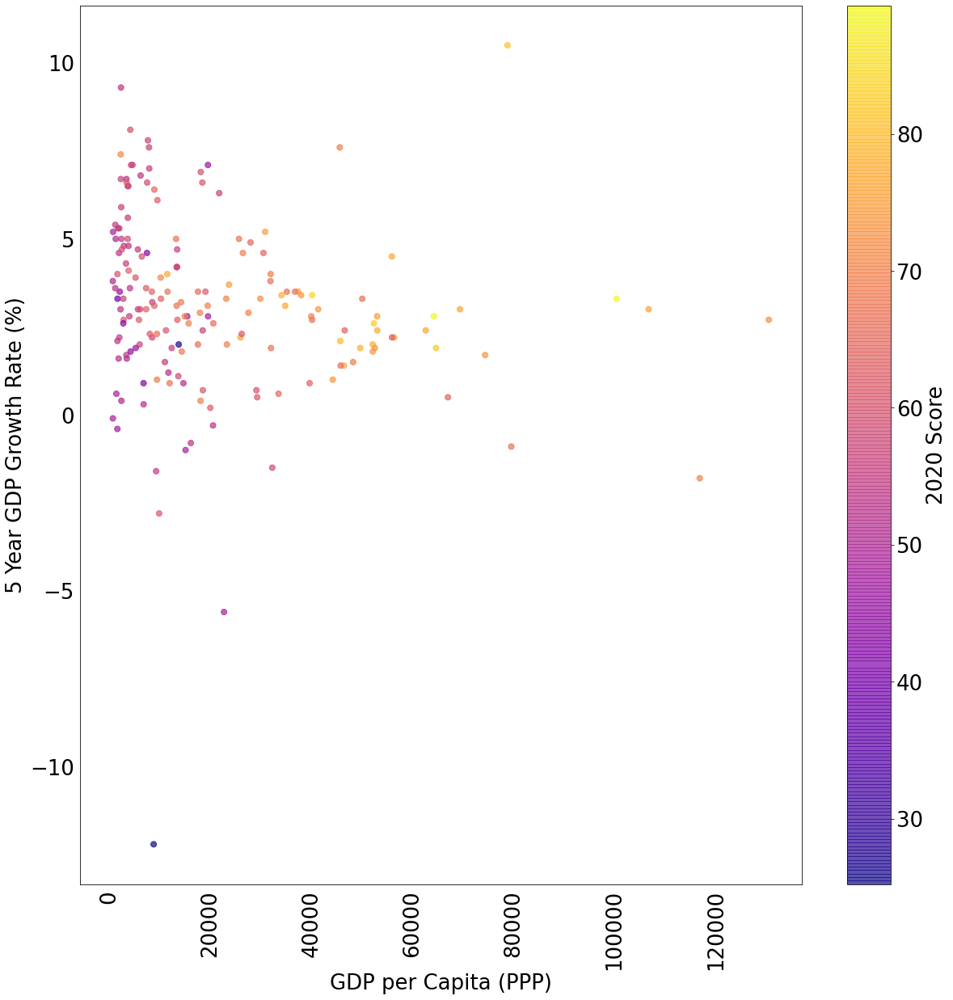

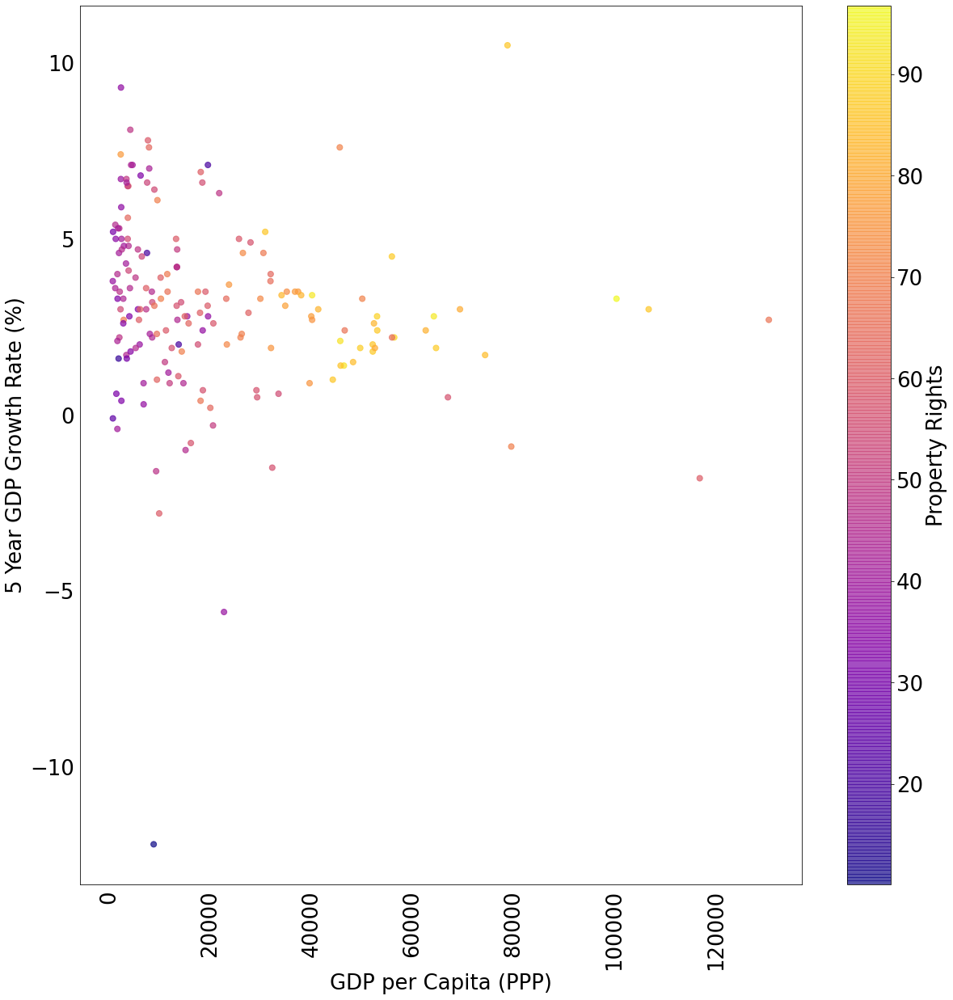

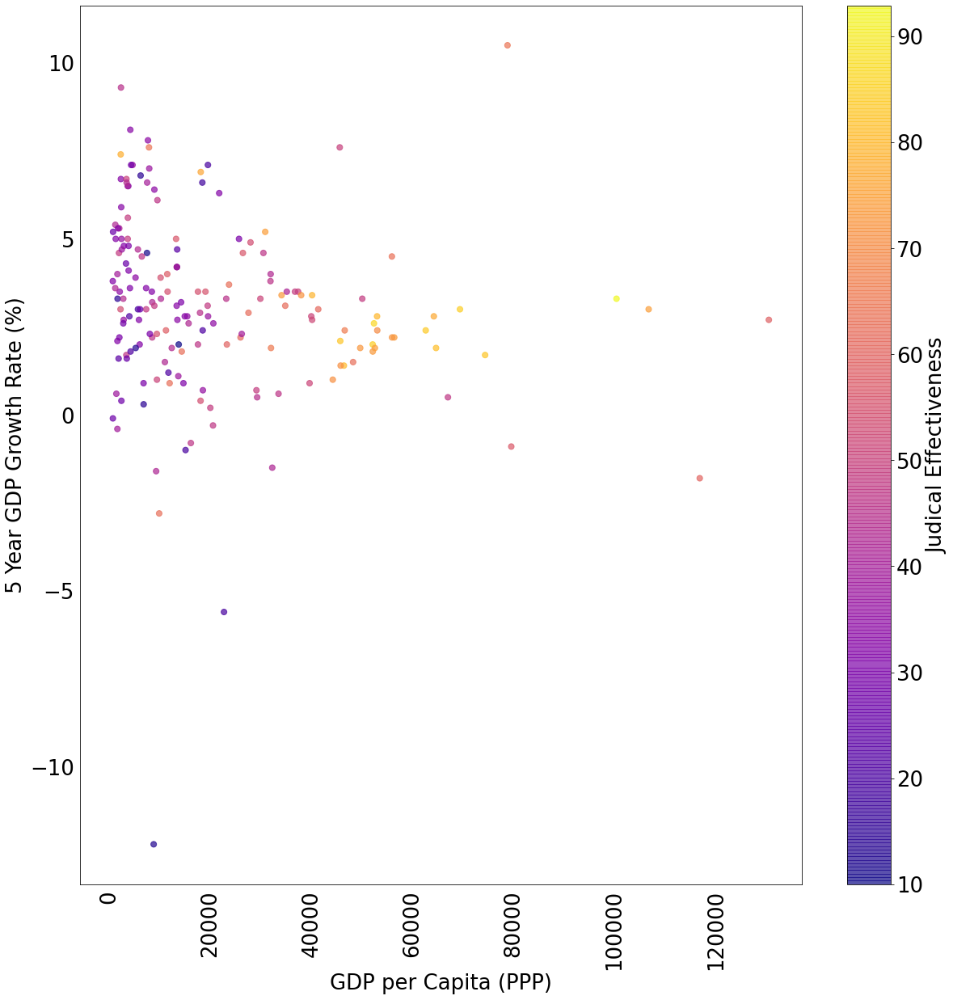

In [8]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages

def color_dim_scatter(data, pp):  
    # function uses color as dimension in scatter plot  
    for key1 in data:  
        for key2 in data:  
            # do not use same variable for x and y dimension  
            if key1 != key2:  
                for key3 in data:  
                    # do not create visualization if key1 or key2  
                    # equals key3  
                    if key1 != key3 and key2 != key3:  
                        # Choose figure size and save ax as object  
                        fig, ax = plt.subplots(figsize = (20, 20))  
                        # each point represents an observation with 3 different  
                        # values: key1 on the horiz ax, key2 on the vert ax,   
                        # and key3 as color  
                        data.plot.scatter(x = key1, y = key2, c = key3, s = 50,  
                                          alpha = .7, colormap = "plasma",  
                                          ax = ax)  
                        # Make values on x-axis vertical  
                        plt.xticks(rotation = 90)  
                        # Remove tick lines  
                        plt.setp(ax.get_xticklines(), visible = False)  
                        plt.setp(ax.get_yticklines(), visible = False)  
                        plt.show()  
                        pp.savefig(fig, bbox_inches = "tight")  
                        plt.close()  
# . . .
# Save plots in a pdf using PdfPages
pp = PdfPages("Economic Freedom Plots.pdf")
# set default size of font in figures
plt.rcParams.update({"font.size" : 26})
# select subset of variables ot visualize in scatter plot
color_dim_scatter(select_data, pp)


## Correlation Heatmap

Next, a correlation matrix with a heatmap. This will once again be created in a similar fashion. The heatmap allows us to see positive and negative correlation very easily, as it is color coded. We will create the heatmap as follows:

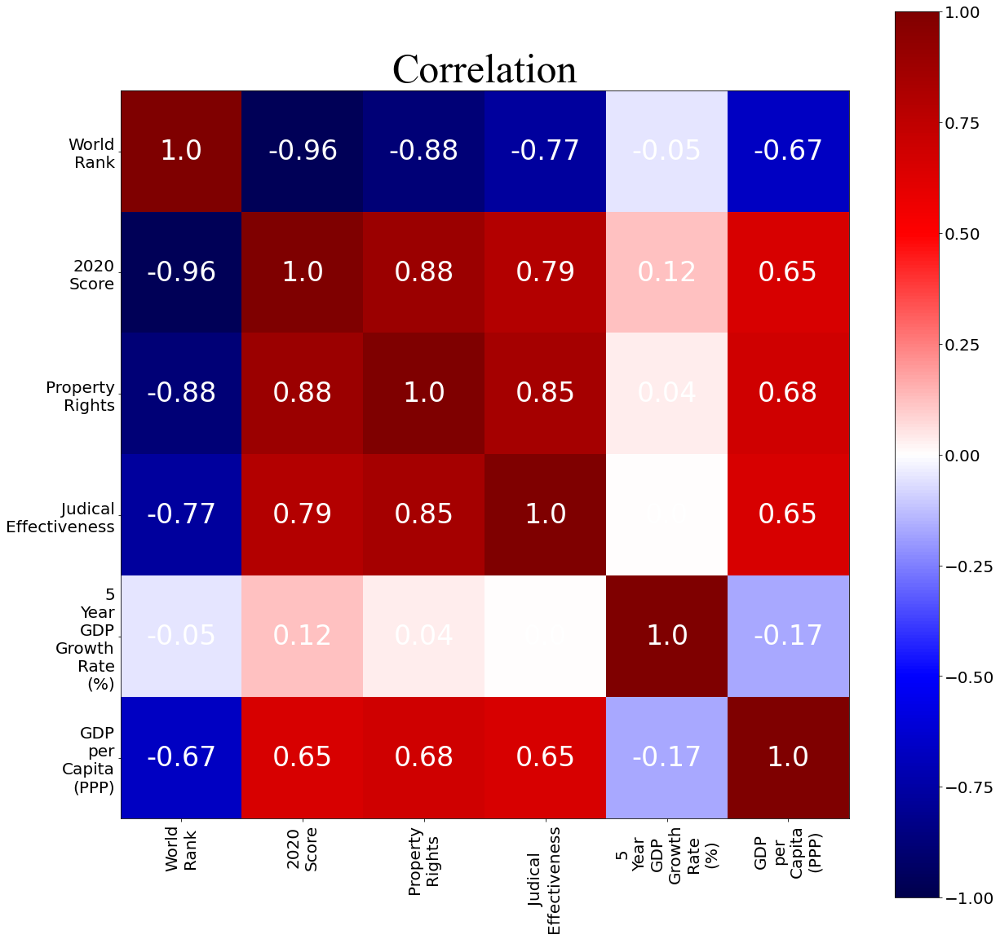

In [9]:
import numpy as np
# . . .
def corr_matrix_heatmap(data, pp):  
    #Create a figure to visualize a corr matrix  
    fig, ax = plt.subplots(figsize=(20,20))  
    # use ax.imshow() to create a heatmap of correlation values  
    # seismic mapping shows negative values as blue and positive values as red  
    im = ax.imshow(data, norm = plt.cm.colors.Normalize(-1,1), cmap = "seismic")  
    # create a list of labels, stacking each word in a label by replacing " "  
    # with "\n"  
    labels = data.keys()  
    num_vars = len(labels)  
    tick_labels = [lab.replace(" ", "\n") for lab in labels]  
    # adjust font size according to the number of variables visualized  
    tick_font_size = 120 / num_vars  
    val_font_size = 200 / num_vars  
    plt.rcParams.update({'font.size': tick_font_size}) 
    # prepare space for label of each column  
    x_ticks = np.arange(num_vars)  
    # select labels and rotate them 90 degrees so that they are vertical  
    plt.xticks(x_ticks, tick_labels, fontsize = tick_font_size, rotation = 90)  
    # prepare space for label of each row  
    y_ticks = np.arange(len(labels))  
    # select labels  
    plt.yticks(y_ticks, tick_labels, fontsize = tick_font_size)  
    # show values in each tile of the heatmap  
    for i in range(len(labels)):  
        for j in range(len(labels)):  
            text = ax.text(i, j, str(round(data.values[i][j],2)),  
                           fontsize= val_font_size, ha="center",   
                           va="center", color = "w")  
    #Create title with Times New Roman Font  
    title_font = {"fontname":"Times New Roman"}  
    plt.title("Correlation", fontsize = 50, **title_font)  
    #Call scale to show value of colors 
    cbar = fig.colorbar(im)
    plt.show()
    pp.savefig(fig, bbox_inches="tight")
    plt.close()

#. . . 
# . . .
corr_data = pd.read_csv("econFreedomCorrMatrix.csv", index_col = [0])
select_corr_data = corr_data.loc[scatter_cats][scatter_cats]
corr_matrix_heatmap(select_corr_data, pp)

This is a very impactful visualization, allowing the viewer(s) to unpack a lot with one plot. Correlation is a powerful tool, and says a lot about a dataset and the variables' relationships within.

## Scatterplots and Distributions in a Single Figure

This figure will contain scatterplots of a list of selected variables. We will once again use pandas:

<ipython-input-11-fa5e7862328e>:9: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  pd.plotting.scatter_matrix(data,alpha = .5, s = 108 / num_vars, ax=ax)


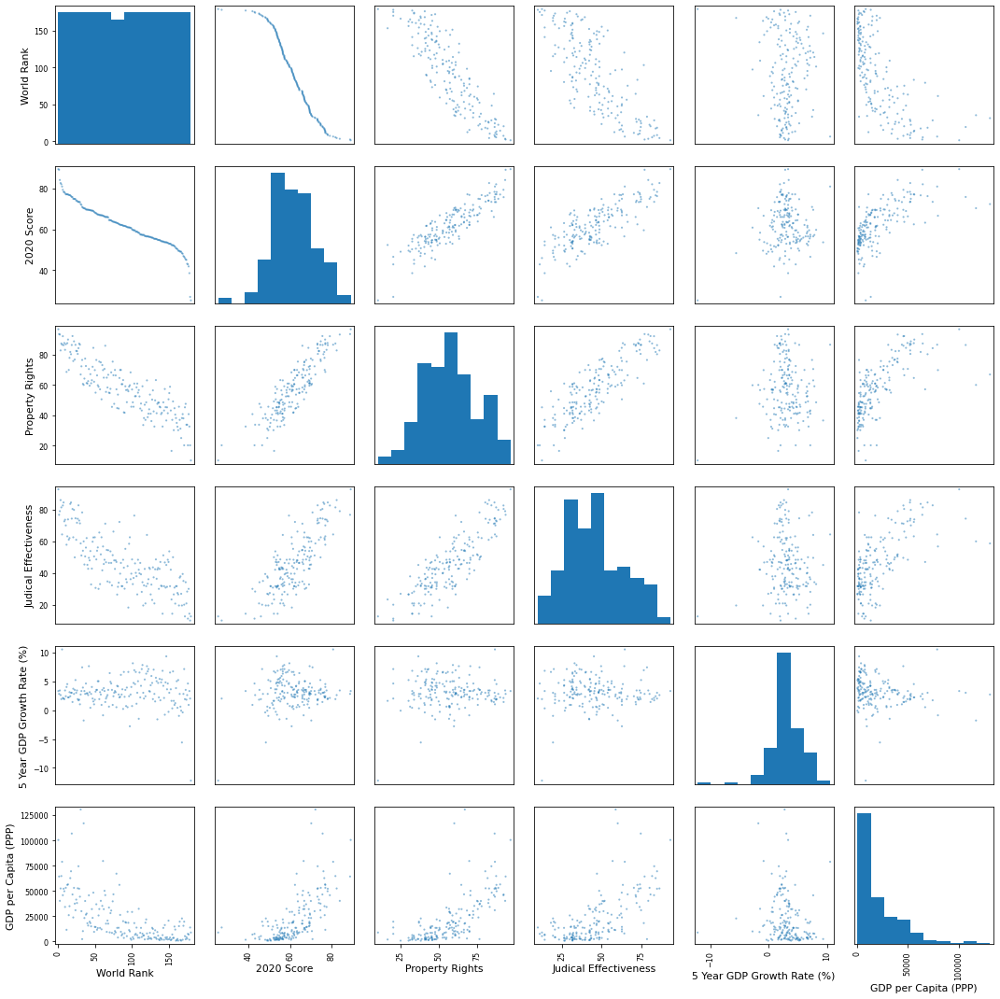

AttributeError: 'NoneType' object has no attribute 'endStream'

In [11]:
def formatted_scatter_matrix(data, pp):  
    # Create a figure showing scatterplots given in scatter_cats  
    fig_len = 15  
    fig, ax = plt.subplots(figsize = ((fig_len, fig_len)))  
    # Use fig_len to dictate fig_size, adjust size of font, size of dots, etc...  
    num_vars = len(data.keys())  
    fontsize = 65 / num_vars  
    plt.rcParams.update({'font.size': fontsize})  
    pd.plotting.scatter_matrix(data,alpha = .5, s = 108 / num_vars, ax=ax)  
    # tight layout improves layout of text and plots in the figure  
    plt.tight_layout()  
    plt.show()  
    pp.savefig(fig, bbox_inches = "tight")  
    plt.close()  
formatted_scatter_matrix(select_data, pp)
pp.close()